In [164]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from  scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from scipy.stats import pearsonr, spearmanr
from scipy.signal import argrelextrema
from scipy.stats import gaussian_kde
import matplotlib.cm as cm

In [165]:
pwd()

'/Users/ritesh/Desktop/Multiaxis_github'

## Preprocessing

In [166]:
exp_data = pd.read_csv('RACIPE_output/a_new_network_solution.dat', sep='\t', header=None)
exp_data.columns = ["Model_Number", "Number_of_Steady_States", "Runs_that_converged_to_steady_state", 
                    "OCT4", "miR145", "AMPK", "HIF1", "miR200", "mtROS", "noxROS", "SNAIL", "ZEB", 
                    "BACH1","RKIP", "SLUG", "CDH1", "Nrf2", "ERa36", "ERa66", "Gata3", "let7", "PD_L1",
                    "Pgr", "Foxa1", "LIN28", "miR34", "np63"]
exp_data

,Model_Number,Number_of_Steady_States,Runs_that_converged_to_steady_state,OCT4,miR145,AMPK,HIF1,miR200,mtROS,noxROS,...,ERa36,ERa66,Gata3,let7,PD_L1,Pgr,Foxa1,LIN28,miR34,np63
0,1,6,57,-4.247256,1.223306,-9.213723,-10.481431,-5.145673,-5.403197,-5.048925,...,7.013079,-19.738626,-3.342506,-18.165797,-6.050346,-15.302690,1.358031,7.184268,-2.358317,-1.202819
1,1,6,12,2.634096,-3.614416,-9.213724,-10.489682,-7.990507,-5.403197,-5.048944,...,7.013073,-14.297125,-3.340829,-18.170342,-1.949474,-15.278334,1.358031,7.184268,-6.736005,-4.023978
2,1,6,8,-10.301662,6.743391,-9.213724,-10.568748,-1.252280,-5.403197,-5.048945,...,7.013078,-16.525237,-3.342178,-18.170043,-11.005908,-13.849954,1.358031,7.184266,-5.691717,-7.684458
3,1,6,9,-4.247256,1.223306,-9.213637,-10.482011,-5.144727,-5.403195,-5.045057,...,7.013079,-19.739186,-3.342506,-11.601665,-6.050347,-15.302690,1.358031,7.184268,-0.805807,-1.202815
4,1,6,9,2.668234,-3.614463,-9.213724,-10.480988,-5.242251,-5.403197,-5.048944,...,7.013079,-19.682316,-3.342504,-18.170201,-1.930269,-15.303938,1.358031,7.184268,-3.929191,-1.202973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71206,10000,8,28,-13.165270,7.811838,-0.016989,-17.569549,11.275604,6.765772,-5.397713,...,1.381384,-8.294858,3.059033,4.962953,-15.132441,-12.015467,0.560675,-9.872565,6.856553,1.885341
71207,10000,8,8,-13.165270,7.811838,-0.016989,-17.568256,5.611314,6.765772,-5.397713,...,1.383542,-11.416862,3.059004,4.962882,-15.063021,-12.454625,0.560674,-9.699911,6.856553,6.231632
71208,10000,8,10,-3.661369,2.758274,-0.297921,-14.110195,1.011702,0.511559,-11.552964,...,1.842609,-17.637890,3.059004,3.876377,-11.996983,-11.533336,0.560674,1.708051,0.912284,6.232503
71209,10000,8,16,-13.165271,7.811838,-0.016989,-23.096724,11.275636,6.765772,-5.397713,...,-9.483298,11.364971,7.387969,8.922314,-25.513147,3.742831,6.395047,-9.905339,6.856553,1.883067


In [167]:
exp_data.columns

Index(['Model_Number', 'Number_of_Steady_States',
       'Runs_that_converged_to_steady_state', 'OCT4', 'miR145', 'AMPK', 'HIF1',
       'miR200', 'mtROS', 'noxROS', 'SNAIL', 'ZEB', 'BACH1', 'RKIP', 'SLUG',
       'CDH1', 'Nrf2', 'ERa36', 'ERa66', 'Gata3', 'let7', 'PD_L1', 'Pgr',
       'Foxa1', 'LIN28', 'miR34', 'np63'],
      dtype='object')

In [168]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
std_data = scaler.fit_transform(exp_data.iloc[:, 3:])
exp_data.iloc[:, 3:] = std_data
exp_data

,Model_Number,Number_of_Steady_States,Runs_that_converged_to_steady_state,OCT4,miR145,AMPK,HIF1,miR200,mtROS,noxROS,...,ERa36,ERa66,Gata3,let7,PD_L1,Pgr,Foxa1,LIN28,miR34,np63
0,1,6,57,-0.022463,-0.109285,-2.472863,-0.973677,-0.531060,-0.871215,-1.205837,...,0.868421,-0.883623,-1.908506,-1.599443,-0.236708,-1.280859,-0.638647,1.010241,-0.900542,-0.184503
1,1,6,12,0.740007,-1.050211,-2.472863,-0.974806,-0.865800,-0.871215,-1.205843,...,0.868420,-0.469868,-1.907989,-1.600039,0.226040,-1.277769,-0.638647,1.010241,-1.817045,-0.709846
2,1,6,8,-0.693306,0.964359,-2.472863,-0.985620,-0.072942,-0.871215,-1.205843,...,0.868421,-0.639287,-1.908405,-1.600000,-0.795901,-1.096582,-0.638647,1.010240,-1.598415,-1.391483
3,1,6,9,-0.022463,-0.109285,-2.472834,-0.973757,-0.530949,-0.871215,-1.204789,...,0.868421,-0.883665,-1.908506,-0.737999,-0.236708,-1.280859,-0.638647,1.010241,-0.575512,-0.184502
4,1,6,9,0.743790,-1.050220,-2.472863,-0.973617,-0.542424,-0.871215,-1.205843,...,0.868421,-0.879341,-1.908505,-1.600021,0.228207,-1.281017,-0.638647,1.010241,-1.229417,-0.184531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71206,10000,8,28,-1.010600,1.172169,0.636489,-1.943144,1.401159,1.693868,-1.300361,...,-0.114331,-0.013475,0.062978,1.435859,-1.261545,-0.863880,-0.910185,-1.563621,1.028662,0.390560
71207,10000,8,8,-1.010600,1.172169,0.636489,-1.942968,0.734667,1.693868,-1.300361,...,-0.113954,-0.250862,0.062969,1.435849,-1.253711,-0.919586,-0.910185,-1.537568,1.028662,1.199905
71208,10000,8,10,0.042455,0.189262,0.541507,-1.469996,0.193451,0.375550,-2.968469,...,-0.033845,-0.723889,0.062969,1.293262,-0.907735,-0.802722,-0.910185,0.183884,-0.215816,1.200068
71209,10000,8,16,-1.010600,1.172169,0.636489,-2.699116,1.401162,1.693868,-1.300361,...,-2.010258,1.481396,1.396161,1.955466,-2.432918,1.135037,1.076698,-1.568567,1.028662,0.390136


In [169]:
exp_data.columns

Index(['Model_Number', 'Number_of_Steady_States',
       'Runs_that_converged_to_steady_state', 'OCT4', 'miR145', 'AMPK', 'HIF1',
       'miR200', 'mtROS', 'noxROS', 'SNAIL', 'ZEB', 'BACH1', 'RKIP', 'SLUG',
       'CDH1', 'Nrf2', 'ERa36', 'ERa66', 'Gata3', 'let7', 'PD_L1', 'Pgr',
       'Foxa1', 'LIN28', 'miR34', 'np63'],
      dtype='object')

In [170]:
median_RKIP = exp_data["RKIP"].median()
for i in range(len(exp_data)):
    if (exp_data.loc[i, 'RKIP'] > median_RKIP):
        exp_data.loc[i, 'RKIP_label'] = 'RKIP_high'
    elif (exp_data.loc[i, 'RKIP'] <= median_RKIP):
        exp_data.loc[i, 'RKIP_label'] = 'RKIP_low'

In [171]:
median_BACH1 = exp_data["BACH1"].median()
for i in range(len(exp_data)):
    if (exp_data.loc[i, 'BACH1'] > median_BACH1):
        exp_data.loc[i, 'BACH1_label'] = 'BACH1_high'
    elif (exp_data.loc[i, 'BACH1'] <= median_BACH1):
        exp_data.loc[i, 'BACH1_label'] = 'BACH1_low'

## No of steady states

In [172]:
df_steady_states = exp_data["Number_of_Steady_States"].value_counts().reset_index()

# Rename columns for clarity
df_steady_states.columns = ["Number_of_Steady_States", "Count"]
i = 0
for count in df_steady_states["Number_of_Steady_States"]:
    print(count)
    print(df_steady_states.loc[i, "Count"])
    df_steady_states.loc[i, "Simulation_Count"] = df_steady_states.loc[i, "Count"] / count
    i += 1

total = df_steady_states["Simulation_Count"].sum()
df_steady_states["Simulation_Count_percentage"] = df_steady_states["Simulation_Count"] / total*100
df_steady_states

10
30480
7
8106
8
7592
9
6948
6
6714
5
5370
4
3456
3
1836
2
610
1
99


,Number_of_Steady_States,Count,Simulation_Count,Simulation_Count_percentage
0,10,30480,3048.0,30.48
1,7,8106,1158.0,11.58
2,8,7592,949.0,9.49
3,9,6948,772.0,7.72
4,6,6714,1119.0,11.19
5,5,5370,1074.0,10.74
6,4,3456,864.0,8.64
7,3,1836,612.0,6.12
8,2,610,305.0,3.05
9,1,99,99.0,0.99


In [173]:
df_steady_states["Simulation_Count"].sum()

np.float64(10000.0)

In [174]:
for i in range(len(df_steady_states)):
    if (df_steady_states.loc[i, 'Number_of_Steady_States'] == 1):
        df_steady_states.loc[i, 'Label'] = 'Monostable'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 2):
        df_steady_states.loc[i, 'Label'] = 'Bistable'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 3):
        df_steady_states.loc[i, 'Label'] = 'Tristable'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 4):
        df_steady_states.loc[i, 'Label'] = '4-Stable States'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 5):
        df_steady_states.loc[i, 'Label'] = '5-Stable States'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 6):
        df_steady_states.loc[i, 'Label'] = '6-Stable States'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 7):
        df_steady_states.loc[i, 'Label'] = '7-Stable States'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 8):
        df_steady_states.loc[i, 'Label'] = '8-Stable States'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 9):
        df_steady_states.loc[i, 'Label'] = '9-Stable States'
    elif (df_steady_states.loc[i, 'Number_of_Steady_States'] == 10):
        df_steady_states.loc[i, 'Label'] = '10-Stable States'

In [175]:
df_steady_states

,Number_of_Steady_States,Count,Simulation_Count,Simulation_Count_percentage,Label
0,10,30480,3048.0,30.48,10-Stable States
1,7,8106,1158.0,11.58,7-Stable States
2,8,7592,949.0,9.49,8-Stable States
3,9,6948,772.0,7.72,9-Stable States
4,6,6714,1119.0,11.19,6-Stable States
5,5,5370,1074.0,10.74,5-Stable States
6,4,3456,864.0,8.64,4-Stable States
7,3,1836,612.0,6.12,Tristable
8,2,610,305.0,3.05,Bistable
9,1,99,99.0,0.99,Monostable


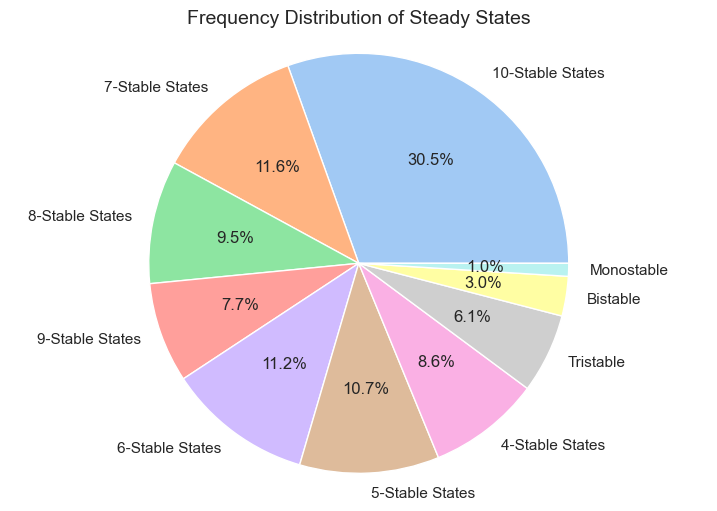

In [176]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set ggplot-like theme
sns.set_theme(style="whitegrid")  # ggplot style theme

# Define figure size
plt.figure(figsize=(9, 6))

# Create pie chart
plt.pie(
    df_steady_states["Simulation_Count_percentage"], 
    labels=df_steady_states["Label"], 
    autopct='%1.1f%%', 
    startangle=0, 
    colors=sns.color_palette("pastel")  # Soft ggplot-like colors
)
# plt.legend(
#     title="Number of Steady States", 
#     loc="upper right", 
#     bbox_to_anchor=(1.2, 1), 
#     fontsize=9
# )
# Ensure the pie chart is circular
plt.axis('equal')
# Add title
plt.title('Frequency Distribution of Steady States', fontsize=14)
plt.savefig('RACIPE_output/steady_states_pie_chart.png', dpi=300, bbox_inches='tight')

## PCA analysis 

In [177]:
exp_data.iloc[:, 3:27].head()

,OCT4,miR145,AMPK,HIF1,miR200,mtROS,noxROS,SNAIL,ZEB,BACH1,...,ERa36,ERa66,Gata3,let7,PD_L1,Pgr,Foxa1,LIN28,miR34,np63
0,-0.022463,-0.109285,-2.472863,-0.973677,-0.531060,-0.871215,-1.205837,0.127271,1.362088,0.688302,...,0.868421,-0.883623,-1.908506,-1.599443,-0.236708,-1.280859,-0.638647,1.010241,-0.900542,-0.184503
1,0.740007,-1.050211,-2.472863,-0.974806,-0.865800,-0.871215,-1.205843,0.644372,1.217450,0.688302,...,0.868420,-0.469868,-1.907989,-1.600039,0.226040,-1.277769,-0.638647,1.010241,-1.817045,-0.709846
2,-0.693306,0.964359,-2.472863,-0.985620,-0.072942,-0.871215,-1.205843,0.610422,0.129289,0.688302,...,0.868421,-0.639287,-1.908405,-1.600000,-0.795901,-1.096582,-0.638647,1.010240,-1.598415,-1.391483
3,-0.022463,-0.109285,-2.472834,-0.973757,-0.530949,-0.871215,-1.204789,-0.353055,1.348336,0.688256,...,0.868421,-0.883665,-1.908506,-0.737999,-0.236708,-1.280859,-0.638647,1.010241,-0.575512,-0.184502
4,0.743790,-1.050220,-2.472863,-0.973617,-0.542424,-0.871215,-1.205843,0.274522,1.398028,0.688302,...,0.868421,-0.879341,-1.908505,-1.600021,0.228207,-1.281017,-0.638647,1.010241,-1.229417,-0.184531


In [178]:
from sklearn.decomposition import PCA

pca = PCA(n_components=4)
pca_data = pca.fit_transform(exp_data.iloc[:, 3:27].values)
pca_data = pd.DataFrame(pca_data, columns = ["PC1", "PC2", "PC3", "PC4"])
pca_data

,PC1,PC2,PC3,PC4
0,3.406244,-0.553927,-2.311343,0.015716
1,3.937288,0.337626,-2.925680,0.072939
2,1.811275,0.576566,-3.414071,-1.082442
3,2.799573,-1.017268,-1.780484,0.576546
4,4.088370,-0.312963,-2.464503,0.380174
...,...,...,...,...
71206,-3.707190,-2.894638,-1.031197,0.590324
71207,-3.152622,-3.736250,-0.157821,1.339239
71208,-0.592969,-2.727735,-1.300639,2.810205
71209,-6.172408,0.745647,-0.963725,1.682232


In [179]:
pca.explained_variance_ratio_

array([0.45295575, 0.16924827, 0.07074763, 0.04606822])

In [180]:
pc1_components = pd.DataFrame(pca.components_[0], index = exp_data.columns[3:27], columns = ["PC1"])
pc2_components = pd.DataFrame(pca.components_[1], index = exp_data.columns[3:27], columns = ["PC2"])
pc1_components = pc1_components.sort_values(by = "PC1", ascending = False)
pc2_components = pc2_components.sort_values(by = "PC2", ascending = False)

/var/folders/kl/lmprrv7x4jxczg7pfbq62wxm0000gn/T/ipykernel_60489/1516828575.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("coolwarm")


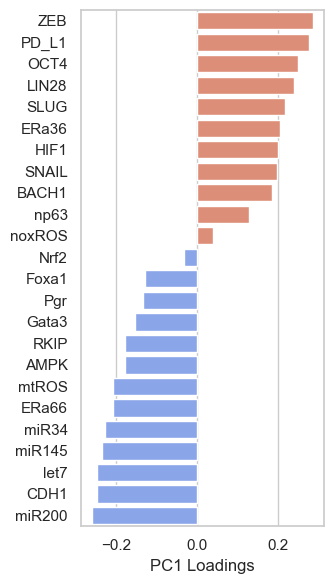

In [181]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(3.5, 6), dpi=100)

# Add a categorical column for sign
pc1_components = pc1_components.copy()
pc1_components["Sign"] = pc1_components["PC1"].apply(lambda v: "Positive" if v > 0 else "Negative")

cmap = cm.get_cmap("coolwarm")
cool_color = cmap(0.20)   # deep blue
warm_color = cmap(0.80)   # deep red

sns.barplot(
    x="PC1",
    y=pc1_components.index,
    hue="Sign",
    data=pc1_components,
    palette={"Positive": warm_color, "Negative": cool_color},
    dodge=False,
    legend=False
)

plt.xlabel("PC1 Loadings")
plt.ylabel("")
# plt.title("PC1 Loadings")
plt.tight_layout()
plt.show()


/var/folders/kl/lmprrv7x4jxczg7pfbq62wxm0000gn/T/ipykernel_60489/2182684081.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("coolwarm")


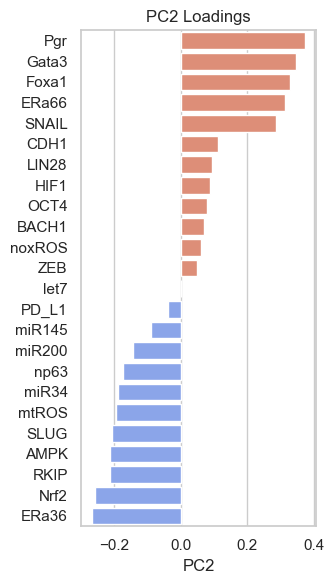

In [182]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Get the end colors of the "coolwarm" colormap
cmap = cm.get_cmap("coolwarm")
cool_color = cmap(0.20)   # deep blue
warm_color = cmap(0.80)   # deep red

plt.figure(figsize=(3.5, 6), dpi=100)

# Add a categorical column for sign
pc2_components = pc2_components.copy()
pc2_components["Sign"] = pc2_components["PC2"].apply(lambda v: "Positive" if v > 0 else "Negative")

sns.barplot(
    x="PC2",
    y=pc2_components.index,
    hue="Sign",
    data=pc2_components,
    palette={"Positive": warm_color, "Negative": cool_color},
    dodge=False,
    legend=False
)

plt.xlabel("PC2")
plt.ylabel("")
plt.title("PC2 Loadings")
plt.tight_layout()
plt.show()


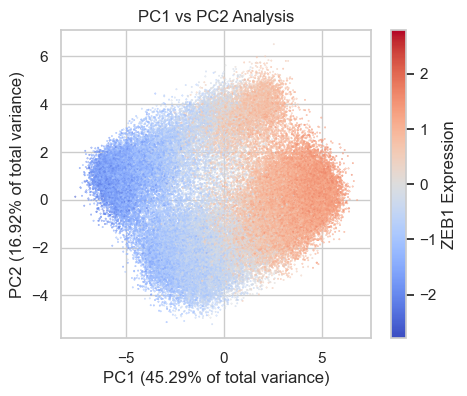

In [183]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

extreme = max(abs(exp_data["ZEB"].max()), abs(exp_data["ZEB"].min()))
neg_extreme = -1 * extreme
norm = TwoSlopeNorm(vmin=neg_extreme, 
                    vcenter=0, 
                    vmax=extreme)

plt.figure(figsize=(5, 4))
sc = plt.scatter(x=pca_data["PC1"], y=pca_data["PC2"], 
                 c=exp_data["ZEB"].values, 
                 cmap="coolwarm", s=0.1, 
                 norm=norm)

plt.colorbar(sc, label='ZEB1 Expression')
plt.xlabel("PC1 (45.29% of total variance)")
plt.ylabel("PC2 (16.92% of total variance)")
plt.title("PC1 vs PC2 Analysis")
plt.show()

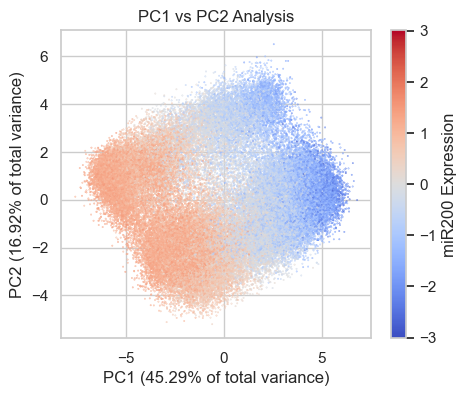

In [184]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

extreme = max(abs(exp_data["miR200"].max()), abs(exp_data["miR200"].min()))
neg_extreme = -1 * extreme
norm = TwoSlopeNorm(vmin=neg_extreme, 
                    vcenter=0, 
                    vmax=extreme)

plt.figure(figsize=(5, 4))
sc = plt.scatter(x=pca_data["PC1"], y=pca_data["PC2"], 
                 c=exp_data["miR200"].values, 
                 cmap="coolwarm", s=0.1, 
                 norm=norm)

plt.colorbar(sc, label='miR200 Expression')
plt.xlabel("PC1 (45.29% of total variance)")
plt.ylabel("PC2 (16.92% of total variance)")
plt.title("PC1 vs PC2 Analysis")
plt.show()

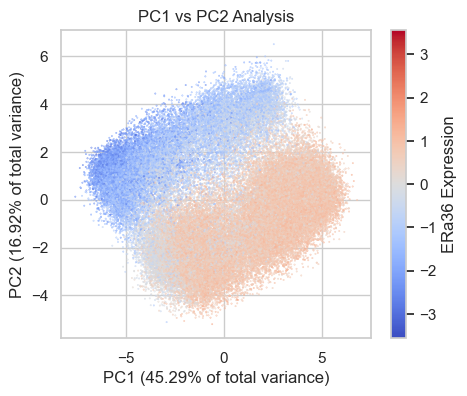

In [185]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

extreme = max(abs(exp_data["ERa36"].max()), abs(exp_data["ERa36"].min()))
neg_extreme = -1 * extreme
norm = TwoSlopeNorm(vmin=neg_extreme, 
                    vcenter=0, 
                    vmax=extreme)

plt.figure(figsize=(5, 4))
sc = plt.scatter(x=pca_data["PC1"], y=pca_data["PC2"], 
                 c=exp_data["ERa36"].values, 
                 cmap="coolwarm", s=0.1, 
                 norm=norm)

plt.colorbar(sc, label='ERa36 Expression')
plt.xlabel("PC1 (45.29% of total variance)")
plt.ylabel("PC2 (16.92% of total variance)")
plt.title("PC1 vs PC2 Analysis")
plt.show()

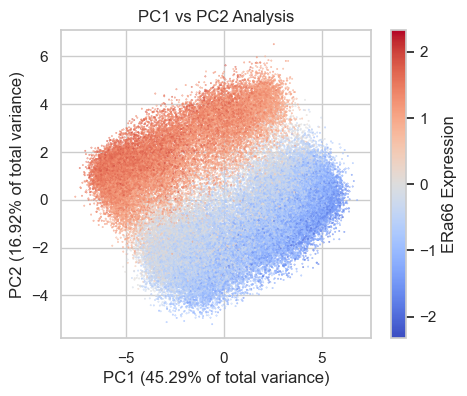

In [186]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

extreme = max(abs(exp_data["ERa66"].max()), abs(exp_data["ERa66"].min()))
neg_extreme = -1 * extreme
norm = TwoSlopeNorm(vmin=neg_extreme, 
                    vcenter=0, 
                    vmax=extreme)

plt.figure(figsize=(5, 4))
sc = plt.scatter(x=pca_data["PC1"], y=pca_data["PC2"], 
                 c=exp_data["ERa66"].values, 
                 cmap="coolwarm", s=0.1, 
                 norm=norm)

plt.colorbar(sc, label='ERa66 Expression')
plt.xlabel("PC1 (45.29% of total variance)")
plt.ylabel("PC2 (16.92% of total variance)")
plt.title("PC1 vs PC2 Analysis")
plt.show()

## Defining Score and correlation analysis

In [187]:
exp_data['mesenchymal score'] = (exp_data['ZEB'] + exp_data['SLUG'])/2
exp_data['epithelial score'] = (exp_data['miR200'] + exp_data['CDH1'])/2
exp_data["EMT_score"] = (exp_data["ZEB"] + exp_data["SLUG"] - exp_data["miR200"] - exp_data["CDH1"]) / 4

exp_data['luminal score'] = (exp_data['ERa66'] + exp_data['Gata3'] + exp_data['Pgr'] + exp_data['Foxa1'])/4
exp_data['basal score'] = (exp_data['SLUG'] + exp_data['np63'])/2
exp_data["Luminal-Basal Score"] = (exp_data["luminal score"] - exp_data["basal score"])

exp_data["Glycolysis_score"] = (exp_data["HIF1"] + exp_data["noxROS"]) / 2
exp_data["OxPhos_score"] = (exp_data["AMPK"] + exp_data["mtROS"]) / 2
exp_data["Resistance score"] = exp_data['ERa36'] - exp_data['ERa66']

exp_data["SN_score"] = ((exp_data["OCT4"] + exp_data["LIN28"] - exp_data["miR145"] - exp_data["let7"])/4) # type: ignore
exp_data

,Model_Number,Number_of_Steady_States,Runs_that_converged_to_steady_state,OCT4,miR145,AMPK,HIF1,miR200,mtROS,noxROS,...,mesenchymal score,epithelial score,EMT_score,luminal score,basal score,Luminal-Basal Score,Glycolysis_score,OxPhos_score,Resistance score,SN_score
0,1,6,57,-0.022463,-0.109285,-2.472863,-0.973677,-0.531060,-0.871215,-1.205837,...,1.172530,-0.564822,0.868676,-1.177909,0.399235,-1.577144,-1.089757,-1.672039,1.752044,0.674126
1,1,6,12,0.740007,-1.050211,-2.472863,-0.974806,-0.865800,-0.871215,-1.205843,...,0.809751,-0.540369,0.675060,-1.073568,-0.153896,-0.919672,-1.090324,-1.672039,1.338289,1.100125
2,1,6,8,-0.693306,0.964359,-2.472863,-0.985620,-0.072942,-0.871215,-1.205843,...,0.017694,0.465023,-0.223665,-1.070730,-0.742692,-0.328038,-1.095731,-1.672039,1.507708,0.238144
3,1,6,9,-0.022463,-0.109285,-2.472834,-0.973757,-0.530949,-0.871215,-1.204789,...,1.165721,-0.564767,0.865244,-1.177919,0.399302,-1.577221,-1.089273,-1.672024,1.752087,0.458765
4,1,6,9,0.743790,-1.050220,-2.472863,-0.973617,-0.542424,-0.871215,-1.205843,...,1.188035,-0.607211,0.897623,-1.176878,0.396755,-1.573632,-1.089730,-1.672039,1.747762,1.101068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71206,10000,8,28,-1.010600,1.172169,0.636489,-1.943144,1.401159,1.693868,-1.300361,...,-0.451455,0.920844,-0.686149,-0.431140,0.063513,-0.494654,-1.621753,1.165178,-0.100855,-1.295562
71207,10000,8,8,-1.010600,1.172169,0.636489,-1.942968,0.734667,1.693868,-1.300361,...,0.144711,0.255815,-0.055552,-0.504416,1.051094,-1.555511,-1.621664,1.165178,0.136908,-1.289047
71208,10000,8,10,0.042455,0.189262,0.541507,-1.469996,0.193451,0.375550,-2.968469,...,0.797652,-0.378039,0.587846,-0.593457,1.212187,-1.805644,-2.219233,0.458529,0.690044,-0.314046
71209,10000,8,16,-1.010600,1.172169,0.636489,-2.699116,1.401162,1.693868,-1.300361,...,-1.297674,1.267600,-1.282637,1.272323,-0.507096,1.779419,-1.999738,1.165178,-3.491654,-1.426700


In [188]:
scores_req = ['EMT_score', 'Glycolysis_score', "SN_score", 'OxPhos_score', "Resistance score", "luminal score", "basal score", "Luminal-Basal Score", "RKIP", "BACH1", "PD_L1"]

len(scores_req)
df_r_values = pd.DataFrame(index = ["RKIP", "BACH1"], columns = scores_req)
df_p_values = pd.DataFrame(index = ["RKIP", "BACH1"], columns = scores_req)
df_r_values

,EMT_score,Glycolysis_score,SN_score,OxPhos_score,Resistance score,luminal score,basal score,Luminal-Basal Score,RKIP,BACH1,PD_L1
RKIP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BACH1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [189]:
for i in scores_req:
    for j in scores_req:
        # print(i, j)
        r, p = spearmanr(exp_data[i], exp_data[j])
        df_r_values.loc[i, j] = r
        df_p_values.loc[i, j] = p

df_r_values

,EMT_score,Glycolysis_score,SN_score,OxPhos_score,Resistance score,luminal score,basal score,Luminal-Basal Score,RKIP,BACH1,PD_L1
RKIP,-0.449008,-0.211479,-0.580305,0.533511,-0.238119,0.054763,-0.12798,0.096527,1.0,-0.642425,-0.463859
BACH1,0.485827,0.208695,0.553746,-0.463171,0.352513,-0.176736,0.308999,-0.274485,-0.642425,1.0,0.462592
EMT_score,1.0,0.44628,0.791161,-0.639509,0.707257,-0.538833,0.737506,-0.744378,-0.449008,0.485827,0.857345
Glycolysis_score,0.44628,1.0,0.314573,-0.386936,0.233674,-0.109787,0.327298,-0.242902,-0.211479,0.208695,0.487345
SN_score,0.791161,0.314573,1.0,-0.588492,0.555781,-0.341643,0.444013,-0.452623,-0.580305,0.553746,0.819845
OxPhos_score,-0.639509,-0.386936,-0.588492,1.0,-0.278829,0.103922,-0.276013,0.214665,0.533511,-0.463171,-0.581242
Resistance score,0.707257,0.233674,0.555781,-0.278829,1.0,-0.80531,0.632658,-0.822504,-0.238119,0.352513,0.646515
luminal score,-0.538833,-0.109787,-0.341643,0.103922,-0.80531,1.0,-0.532616,0.832413,0.054763,-0.176736,-0.482007
basal score,0.737506,0.327298,0.444013,-0.276013,0.632658,-0.532616,1.0,-0.894608,-0.12798,0.308999,0.554888
Luminal-Basal Score,-0.744378,-0.242902,-0.452623,0.214665,-0.822504,0.832413,-0.894608,1.0,0.096527,-0.274485,-0.593972


In [190]:
df_p_values

,EMT_score,Glycolysis_score,SN_score,OxPhos_score,Resistance score,luminal score,basal score,Luminal-Basal Score,RKIP,BACH1,PD_L1
RKIP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
BACH1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
EMT_score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Glycolysis_score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SN_score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
OxPhos_score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Resistance score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
luminal score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
basal score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Luminal-Basal Score,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [191]:
df_r_values = df_r_values.astype(float)
df_r_values = df_r_values.round(2)
df_r_values

,EMT_score,Glycolysis_score,SN_score,OxPhos_score,Resistance score,luminal score,basal score,Luminal-Basal Score,RKIP,BACH1,PD_L1
RKIP,-0.45,-0.21,-0.58,0.53,-0.24,0.05,-0.13,0.10,1.00,-0.64,-0.46
BACH1,0.49,0.21,0.55,-0.46,0.35,-0.18,0.31,-0.27,-0.64,1.00,0.46
EMT_score,1.00,0.45,0.79,-0.64,0.71,-0.54,0.74,-0.74,-0.45,0.49,0.86
Glycolysis_score,0.45,1.00,0.31,-0.39,0.23,-0.11,0.33,-0.24,-0.21,0.21,0.49
SN_score,0.79,0.31,1.00,-0.59,0.56,-0.34,0.44,-0.45,-0.58,0.55,0.82
OxPhos_score,-0.64,-0.39,-0.59,1.00,-0.28,0.10,-0.28,0.21,0.53,-0.46,-0.58
Resistance score,0.71,0.23,0.56,-0.28,1.00,-0.81,0.63,-0.82,-0.24,0.35,0.65
luminal score,-0.54,-0.11,-0.34,0.10,-0.81,1.00,-0.53,0.83,0.05,-0.18,-0.48
basal score,0.74,0.33,0.44,-0.28,0.63,-0.53,1.00,-0.89,-0.13,0.31,0.55
Luminal-Basal Score,-0.74,-0.24,-0.45,0.21,-0.82,0.83,-0.89,1.00,0.10,-0.27,-0.59


In [192]:
def add_significance_markers(value, p_value):
    if p_value < 0.001:
        return str(f"{value: .3f}***")
    elif p_value < 0.01:
        return str(f"{value: .3f}**")
    elif p_value < 0.05:
        return str(f"{value: .3f}*")
    else:
        return str(f"{value: .3f}")     

In [193]:
# Convert r_values_luminal to numeric type
r_value_numeric = df_r_values.apply(pd.to_numeric)

annot_matrix = pd.DataFrame(
    r_value_numeric,  # Use the values of df_random
).copy()

for row in r_value_numeric.index:
    for col in r_value_numeric.columns:
        annot_matrix.at[row, col] = add_significance_markers(r_value_numeric.loc[row, col], df_p_values.loc[row, col])

/var/folders/kl/lmprrv7x4jxczg7pfbq62wxm0000gn/T/ipykernel_60489/2079493532.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.450***' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annot_matrix.at[row, col] = add_significance_markers(r_value_numeric.loc[row, col], df_p_values.loc[row, col])
/var/folders/kl/lmprrv7x4jxczg7pfbq62wxm0000gn/T/ipykernel_60489/2079493532.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-0.210***' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  annot_matrix.at[row, col] = add_significance_markers(r_value_numeric.loc[row, col], df_p_values.loc[row, col])
/var/folders/kl/lmprrv7x4jxczg7pfbq62wxm0000gn/T/ipykernel_60489/2079493532.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated 

In [194]:
annot_matrix

,EMT_score,Glycolysis_score,SN_score,OxPhos_score,Resistance score,luminal score,basal score,Luminal-Basal Score,RKIP,BACH1,PD_L1
RKIP,-0.450***,-0.210***,-0.580***,0.530***,-0.240***,0.050***,-0.130***,0.100***,1.000***,-0.640***,-0.460***
BACH1,0.490***,0.210***,0.550***,-0.460***,0.350***,-0.180***,0.310***,-0.270***,-0.640***,1.000***,0.460***
EMT_score,1.000***,0.450***,0.790***,-0.640***,0.710***,-0.540***,0.740***,-0.740***,-0.450***,0.490***,0.860***
Glycolysis_score,0.450***,1.000***,0.310***,-0.390***,0.230***,-0.110***,0.330***,-0.240***,-0.210***,0.210***,0.490***
SN_score,0.790***,0.310***,1.000***,-0.590***,0.560***,-0.340***,0.440***,-0.450***,-0.580***,0.550***,0.820***
OxPhos_score,-0.640***,-0.390***,-0.590***,1.000***,-0.280***,0.100***,-0.280***,0.210***,0.530***,-0.460***,-0.580***
Resistance score,0.710***,0.230***,0.560***,-0.280***,1.000***,-0.810***,0.630***,-0.820***,-0.240***,0.350***,0.650***
luminal score,-0.540***,-0.110***,-0.340***,0.100***,-0.810***,1.000***,-0.530***,0.830***,0.050***,-0.180***,-0.480***
basal score,0.740***,0.330***,0.440***,-0.280***,0.630***,-0.530***,1.000***,-0.890***,-0.130***,0.310***,0.550***
Luminal-Basal Score,-0.740***,-0.240***,-0.450***,0.210***,-0.820***,0.830***,-0.890***,1.000***,0.100***,-0.270***,-0.590***


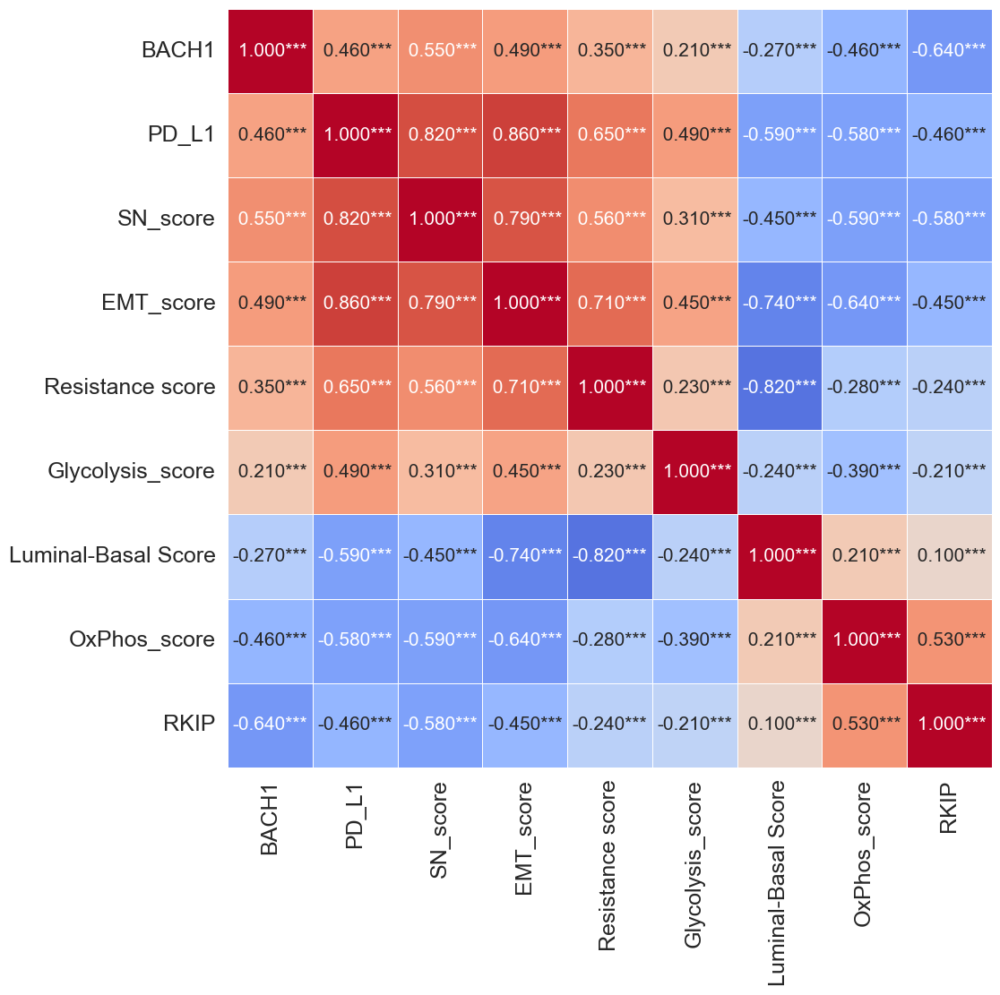

In [195]:
order = ["BACH1", "PD_L1", "SN_score", "EMT_score", "Resistance score", "Glycolysis_score", "Luminal-Basal Score", "OxPhos_score", "RKIP"]

df_r_values = df_r_values.loc[order, order]
df_p_values = df_p_values.loc[order, order]
annot_matrix = annot_matrix.loc[order, order]

plt.figure(figsize=(11, 11))
sns.heatmap(
    df_r_values.astype(float),  # Use numeric values for heatmap
    annot=annot_matrix,  # Use string annotations
    vmax= 1, vmin= -1,
    fmt='s',  # Use string format for annotations
    linewidths=0.5,
    cmap="coolwarm",
    annot_kws={"size": 15},
    cbar= False
)

# plt.title("Correlation Matrix from simulations")
plt.xticks(rotation=90, size=18)
plt.yticks(rotation=0, size=18)
# plt.savefig('RACIPE_output/heatmap_RKIP_BACH1.png', dpi=300, bbox_inches='tight')
plt.show()

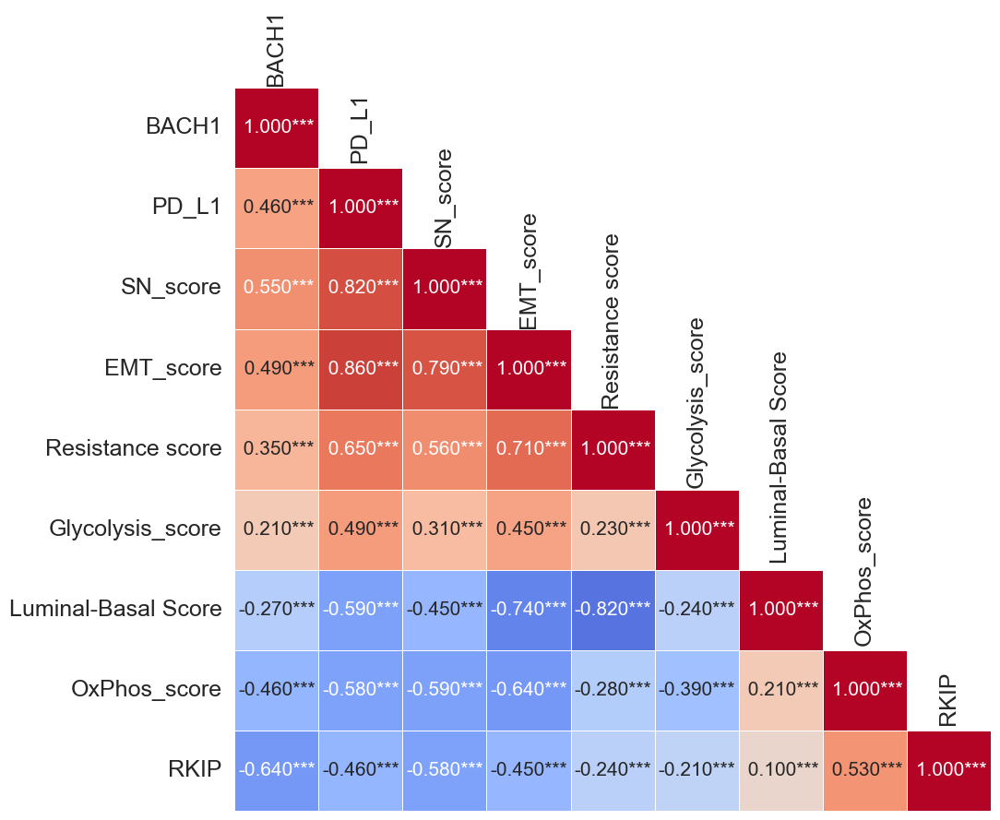

In [196]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

order = ["BACH1", "PD_L1", "SN_score", "EMT_score", "Resistance score",
         "Glycolysis_score", "Luminal-Basal Score", "OxPhos_score", "RKIP"]

# Reorder
df_r_values = df_r_values.loc[order, order]
df_p_values = df_p_values.loc[order, order]
annot_matrix = annot_matrix.loc[order, order]

# Create mask for upper triangle
mask = np.triu(np.ones_like(df_r_values, dtype=bool), k=1)

plt.figure(figsize=(11, 9))
ax = sns.heatmap(
    df_r_values.astype(float),
    annot=annot_matrix,
    mask=mask,              # 👈 hide upper triangle
    vmax=1, vmin=-1,
    fmt='s',
    linewidths=0.5,
    cmap="coolwarm",
    annot_kws={"size": 15},
    cbar=False
)

# Remove default x labels
ax.set_xticklabels([])
ax.set_xlabel("")

# # Add diagonal x-axis labels manually
# for i, label in enumerate(order):
#     ax.text(i + 0.5, -0.5 + i/1.15, label, ha="right", va="center",
#             rotation=90, fontsize=18, transform=ax.transData)

#putting text on the corners
order = ["BACH1", "PD_L1", "SN_score", "EMT_score", "Resistance score",
         "Glycolysis_score", "Luminal-Basal Score", "OxPhos_score", "RKIP"]

ax.text(0.5, -0.5, "BACH1", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(1.5, 0.5, "PD_L1", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(2.5, 1.35, "SN_score", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(3.5, 2.26, "EMT_score", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(4.5, 2.9, "Resistance score", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(5.5, 3.9, "Glycolysis_score", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(6.5, 4.6, "Luminal-Basal Score", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(7.5, 6.00, "OxPhos_score", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
ax.text(8.5, 7.6, "RKIP", ha="center", va="center", rotation=90, fontsize=18, transform=ax.transData)
plt.grid(False)
# Y-axis labels stay as is
ax.set_yticklabels(order, rotation=0, fontsize=18)

plt.tight_layout()
plt.show()


## PCA scatter

In [197]:
exp_data.columns

Index(['Model_Number', 'Number_of_Steady_States',
       'Runs_that_converged_to_steady_state', 'OCT4', 'miR145', 'AMPK', 'HIF1',
       'miR200', 'mtROS', 'noxROS', 'SNAIL', 'ZEB', 'BACH1', 'RKIP', 'SLUG',
       'CDH1', 'Nrf2', 'ERa36', 'ERa66', 'Gata3', 'let7', 'PD_L1', 'Pgr',
       'Foxa1', 'LIN28', 'miR34', 'np63', 'RKIP_label', 'BACH1_label',
       'mesenchymal score', 'epithelial score', 'EMT_score', 'luminal score',
       'basal score', 'Luminal-Basal Score', 'Glycolysis_score',
       'OxPhos_score', 'Resistance score', 'SN_score'],
      dtype='object')

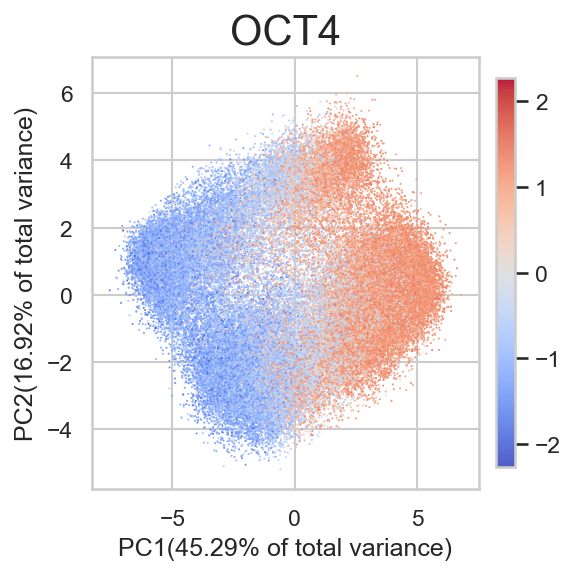

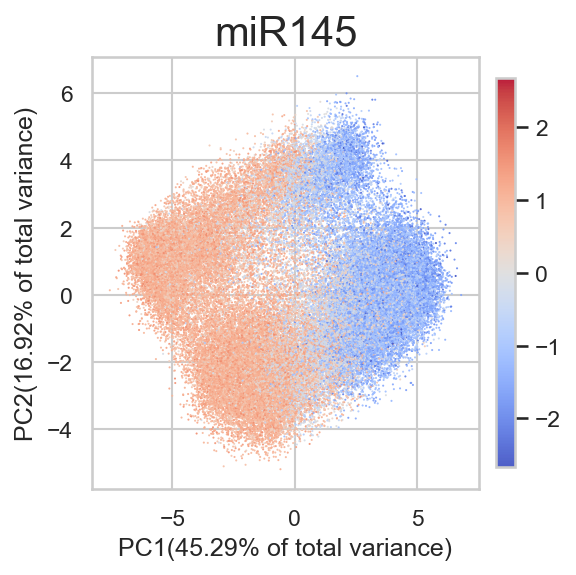

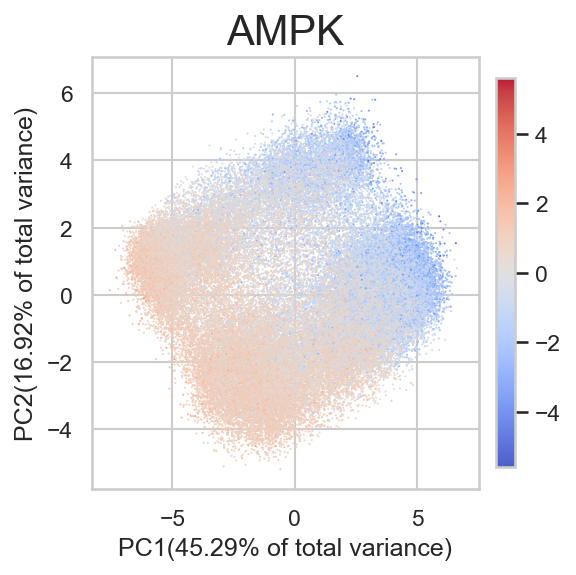

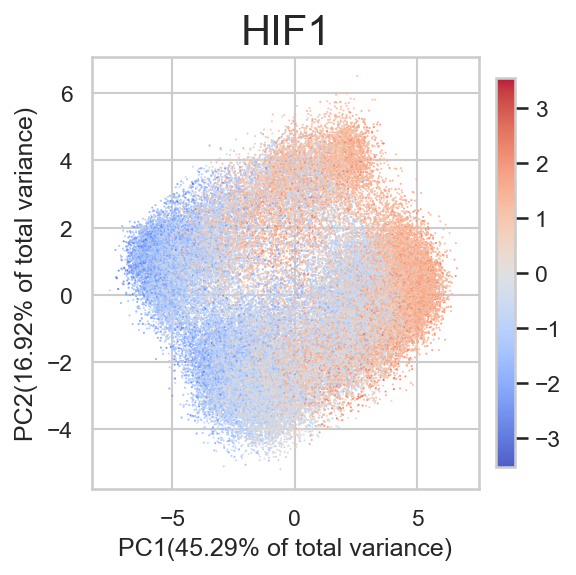

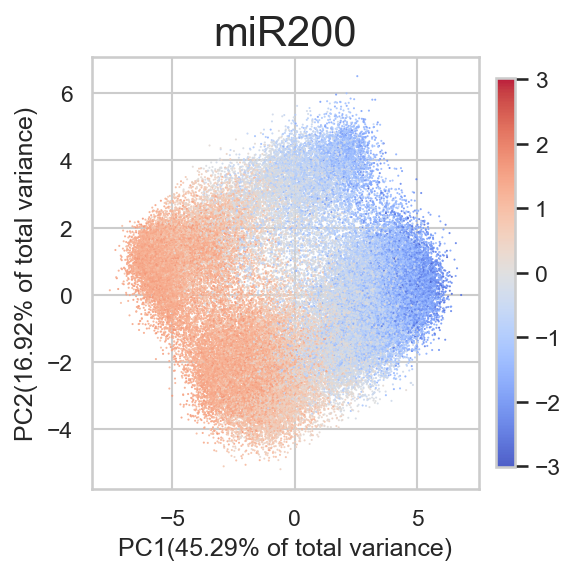

...

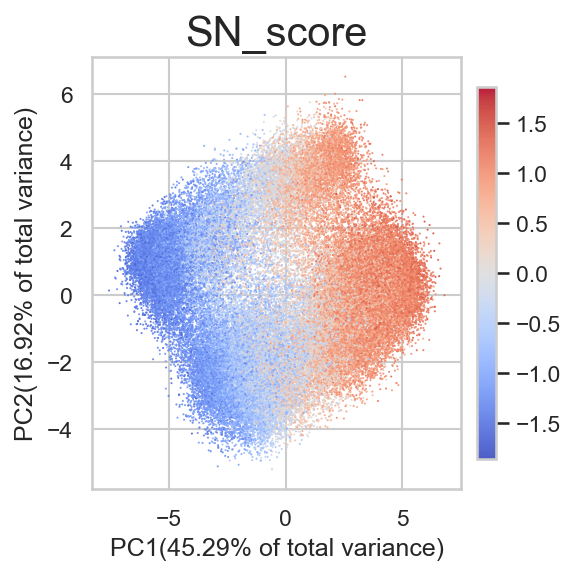

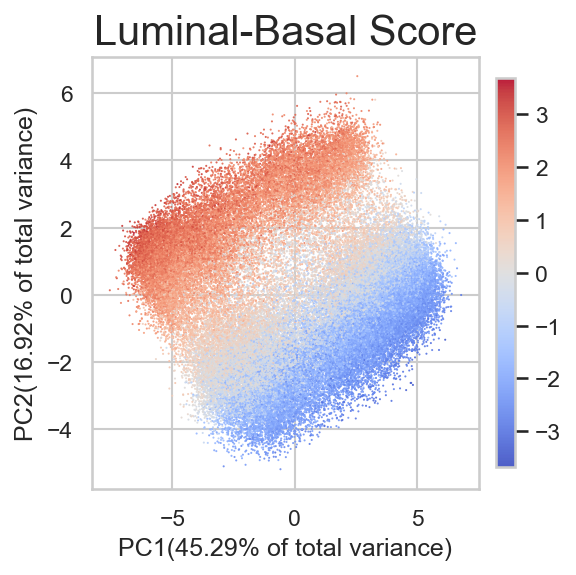

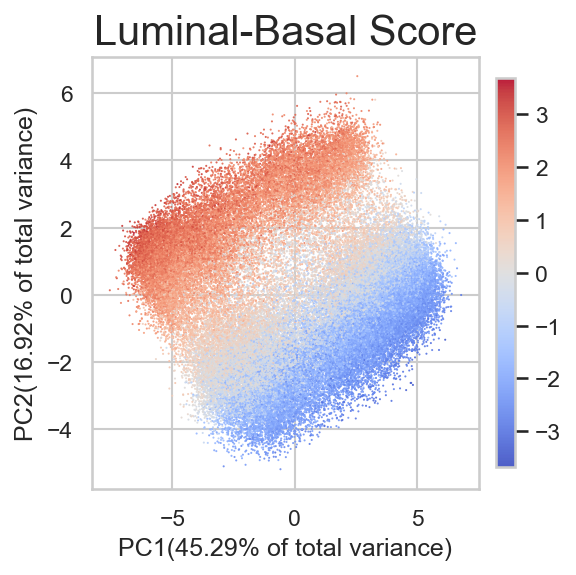

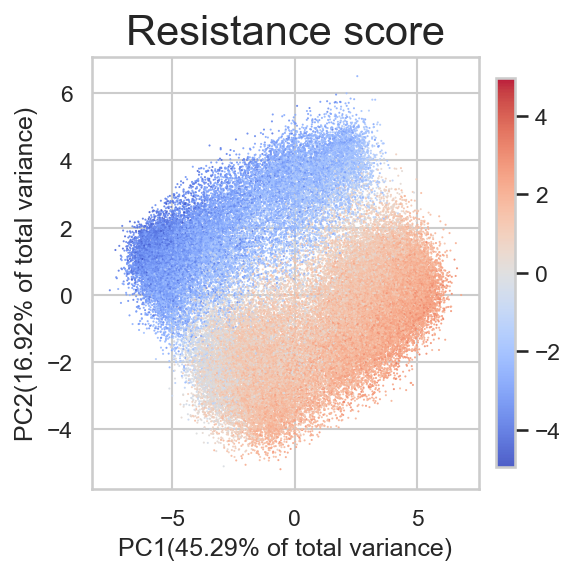

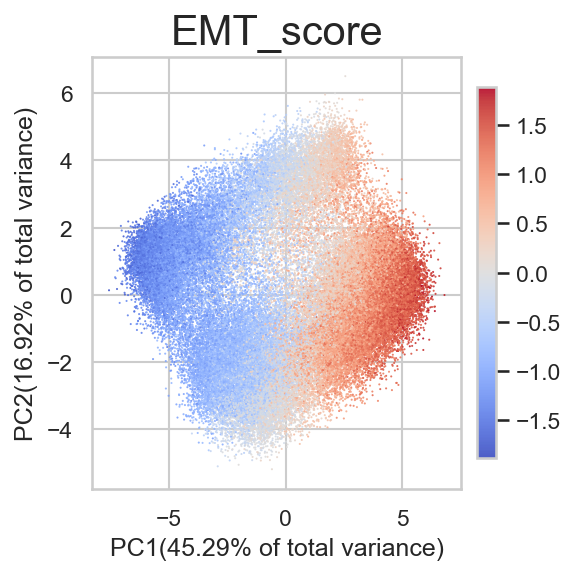

In [198]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np

list_req = ['OCT4', 'miR145', 'AMPK', 'HIF1',
       'miR200', 'mtROS', 'noxROS', 'SNAIL', 'ZEB', 'BACH1', 'RKIP', 'SLUG',
       'CDH1', 'Nrf2', 'ERa36', 'ERa66', 'Gata3', 'let7', 'PD_L1', 'Pgr',
       'Foxa1', 'LIN28', 'miR34', 'np63',
       'Glycolysis_score', 'OxPhos_score',
       'SN_score', 'Luminal-Basal Score',
       'Luminal-Basal Score', 'Resistance score',
       'EMT_score']
# Example loop over columns
for col in list_req:
    # compute symmetric normalization around zero
    extreme = max(abs(exp_data[col].max()), abs(exp_data[col].min()))
    norm = TwoSlopeNorm(vmin=-extreme, vcenter=0, vmax=extreme)

    # Create figure + axis with explicit figsize and dpi
    fig, ax = plt.subplots(figsize=(4, 4), dpi=150)   # DPI controls pixel resolution

    # scatter on the axis (not pyplot) — more explicit & reliable
    sc = ax.scatter(
        x=pca_data["PC1"],
        y=pca_data["PC2"],
        c=exp_data[col].values,
        cmap="coolwarm",
        s=1,              # use a readable marker size (adjust as needed)
        norm=norm,
        linewidths=0,
        alpha=0.9
    )

    # colorbar attached to figure/axis
    cbar = fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

    ax.set_xlabel("PC1(45.29% of total variance)")
    ax.set_ylabel("PC2(16.92% of total variance)")
    ax.set_title(col, fontsize=20)

    fig.tight_layout()
    plt.show()
    # optionally save:
    # fig.savefig(f"pc_scatter_{col}.png", dpi=300, bbox_inches="tight")
    plt.close(fig)


## Scatter plots

### RKIP Expression

/var/folders/kl/lmprrv7x4jxczg7pfbq62wxm0000gn/T/ipykernel_60489/4238781670.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(exp_data["RKIP"], color = "blue", shade = True)


Text(0, 0.5, 'Density')

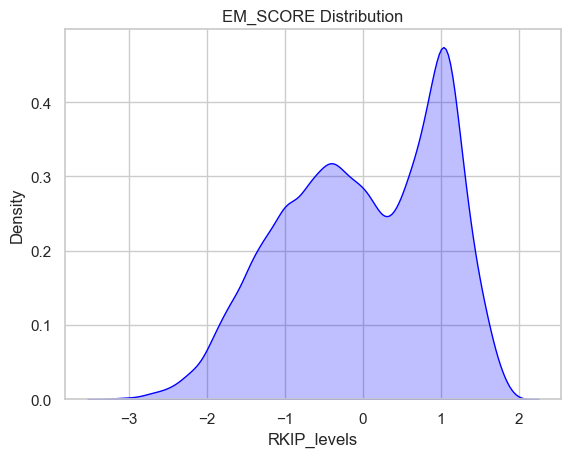

In [199]:
sns.kdeplot(exp_data["RKIP"], color = "blue", shade = True)
plt.title("EM_SCORE Distribution")
# plt.xticks([-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2])
plt.xlabel("RKIP_levels")
plt.ylabel("Density")

/var/folders/kl/lmprrv7x4jxczg7pfbq62wxm0000gn/T/ipykernel_60489/2316539003.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(exp_data["BACH1"], color = "blue", shade = True)


Text(0, 0.5, 'Density')

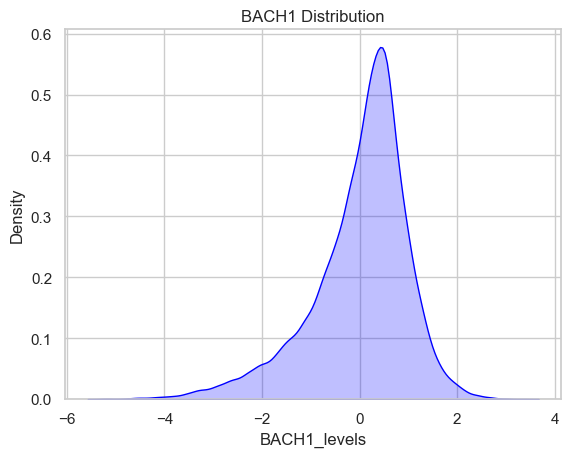

In [200]:
sns.kdeplot(exp_data["BACH1"], color = "blue", shade = True)
plt.title("BACH1 Distribution")
# plt.xticks([-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2])
plt.xlabel("BACH1_levels")
plt.ylabel("Density")

In [201]:
exp_data["BACH1_level"] = ["BACH1+" if x > 0 else "BACH1-" for x in exp_data["BACH1"]]
exp_data["BACH1_level"] = exp_data["BACH1_level"].astype("category")

exp_data["RKIP_level"] = ["RKIP+" if x > 0 else "RKIP-" for x in exp_data["RKIP"]]
exp_data["RKIP_level"] = exp_data["RKIP_level"].astype("category")

### Analysis EMT

In [202]:
exp_data.iloc[:,27:].columns

Index(['RKIP_label', 'BACH1_label', 'mesenchymal score', 'epithelial score',
       'EMT_score', 'luminal score', 'basal score', 'Luminal-Basal Score',
       'Glycolysis_score', 'OxPhos_score', 'Resistance score', 'SN_score',
       'BACH1_level', 'RKIP_level'],
      dtype='object')

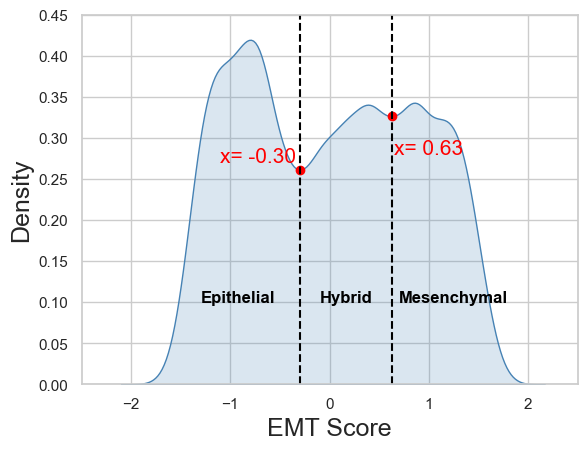

Local minima occur at: [-0.30126339  0.62556324]


In [203]:
# KDE Plot
sns.kdeplot(exp_data['EMT_score'], fill=True, color="steelblue", alpha=0.2)
plt.xlabel('EMT_score')
plt.ylabel('Density')

# Compute KDE
kde = gaussian_kde(exp_data['EMT_score'])
x_vals = np.linspace(exp_data['EMT_score'].min(), exp_data['EMT_score'].max(), 1000)
density = kde(x_vals)

# Find local minima
minima_indices = argrelextrema(density, np.less)[0]
minima_values = x_vals[minima_indices]

# Plot minima points
plt.scatter(minima_values, kde(minima_values), color='red', label='Local Minima')
plt.axvline(x = 0.62556324, linestyle = "--", color = "black")
plt.axvline(x = -0.30126339, linestyle = "--", color = "black")

plt.text(-1.3, 0.1, "Epithelial", fontsize = 12, color = "black", fontweight = "bold")
plt.text(0.70, 0.1, "Mesenchymal", fontsize = 12, color = "black", fontweight = "bold")
plt.text(-0.10, 0.1, "Hybrid", fontsize = 12, color = "black", fontweight = "bold")
plt.text(-1.1, 0.27,  "x= -0.30", fontsize = 15, color = "red")
plt.text(0.65, 0.28, "x= 0.63", fontsize = 15, color = "red")

# plt.legend()?
plt.xlim(-2.5, 2.5)
plt.ylim(0, 0.45)
plt.grid(True)
plt.ylabel('Density', fontsize=18)
plt.xlabel('EMT Score', fontsize=18)
plt.show()

# Print minima values
print("Local minima occur at:", minima_values)

In [204]:
for i in range(len(exp_data.index)):
    if exp_data.loc[i, "EMT_score"] > 0.62556324:
        exp_data.loc[i, "EMT_label"] = "Mesenchymal"
    elif exp_data.loc[i, "EMT_score"] < -0.30126339:
        exp_data.loc[i, "EMT_label"] = "Epithelial"
    else:
        exp_data.loc[i, "EMT_label"] = "Hybrid"

In [205]:
exp_data["EMT_label"].value_counts()

EMT_label
Epithelial     29522
Mesenchymal    21114
Hybrid         20575
Name: count, dtype: int64

In [206]:
minima_values

array([-0.30126339,  0.62556324])

In [207]:
minima_values[1:]

array([0.62556324])

### Analysis stemness

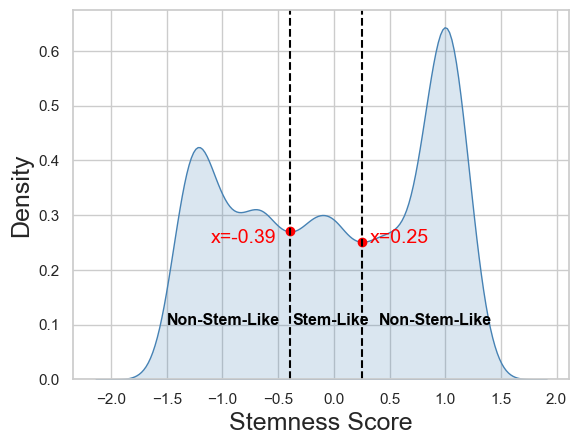

Local minima occur at: [-0.84055349 -0.39114151  0.25684787]


In [208]:
# KDE Plot
sns.kdeplot(exp_data['SN_score'], fill=True, color="steelblue", alpha=0.2)
plt.xlabel('Stemness_score')
plt.ylabel('Density')

# Compute KDE
kde = gaussian_kde(exp_data['SN_score'])
x_vals = np.linspace(exp_data['SN_score'].min(), exp_data['SN_score'].max(), 1000)
density = kde(x_vals)

# Find local minima
minima_indices = argrelextrema(density, np.less)[0]
minima_values = x_vals[minima_indices]

# Plot minima points
plt.scatter(minima_values[1:], kde(minima_values[1:]), color='red', label='Local Minima')
plt.axvline(x = 0.25684787, linestyle = "--", color = "black")
plt.axvline(x = -0.39114151, linestyle = "--", color = "black")
plt.text(-1.5, 0.10, "Non-Stem-Like", fontsize = 11.5, color = "black", fontweight = "bold")
plt.text(0.4, 0.10, "Non-Stem-Like", fontsize = 11.5, color = "black", fontweight = "bold")
plt.text(-0.37, 0.10, "Stem-Like", fontsize = 11.5, color = "black", fontweight = "bold")
plt.text(-1.1, 0.25, "x=-0.39", fontsize = 14, color = "red")
plt.text(0.32, 0.25, "x=0.25", fontsize = 14, color = "red")
# plt.legend()
plt.grid(True)
plt.xlabel('Stemness Score', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.show()

# Print minima values
print("Local minima occur at:", minima_values)

In [209]:
for i in range(len(exp_data.index)):
    if exp_data.loc[i, "SN_score"] > 0.25684787:
        exp_data.loc[i, "SN_label"] = "Non-stem-like"
    elif exp_data.loc[i, "SN_score"] < -0.39114151:
        exp_data.loc[i, "SN_label"] = "Non-stem-like"
    else:
        exp_data.loc[i, "SN_label"] = "Stem-like"

### Analysis Glycolysis

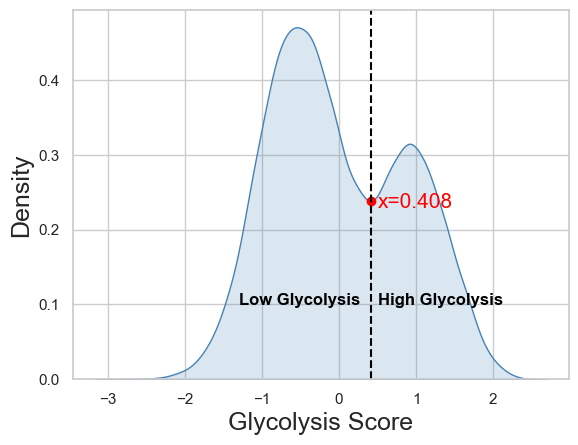

Local minima occur at: [0.40870696]


In [210]:
# KDE Plot
sns.kdeplot(exp_data['Glycolysis_score'], fill=True, color="steelblue", alpha=0.2)
plt.xlabel('Glycolysis_score')
plt.ylabel('Density')

# Compute KDE
kde = gaussian_kde(exp_data['Glycolysis_score'])
x_vals = np.linspace(exp_data['Glycolysis_score'].min(), exp_data['Glycolysis_score'].max(), 1000)
density = kde(x_vals)

# Find local minima
minima_indices = argrelextrema(density, np.less)[0]
minima_values = x_vals[minima_indices]

# Plot minima points
plt.scatter(minima_values, kde(minima_values), color='red', label='Local Minima')
plt.axvline(x = 0.40870696, linestyle = "--", color = "black")
plt.text(-1.3, 0.10, "Low Glycolysis", fontsize = 12, color = "black", fontweight='bold')
plt.text(0.5, 0.10, "High Glycolysis", fontsize = 12, color = "black", fontweight='bold')
plt.text(0.5, 0.23, "x=0.408", fontsize = 15, color = "red")
# plt.legend()
plt.grid(True)
plt.xlabel('Glycolysis Score', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.show()

# Print minima values
print("Local minima occur at:", minima_values)

In [211]:
exp_data["Gly_label"] = ["high_glyc" if x > 0.40870696 else "low_glyc" for x in exp_data["Glycolysis_score"]]

### Anlaysis PDL1

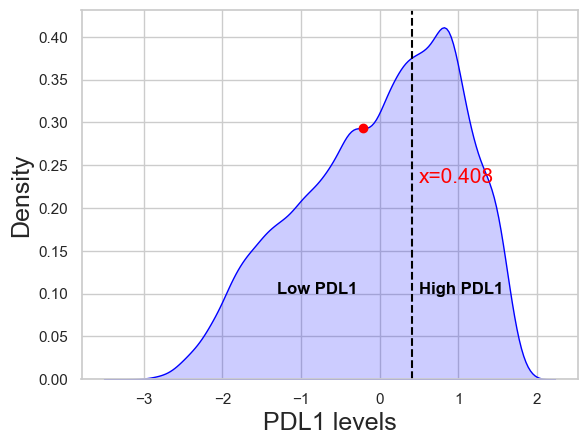

Local minima occur at: [-0.21572493]


In [212]:
# KDE Plot
sns.kdeplot(exp_data['PD_L1'], fill=True, color="Blue", alpha=0.2)
plt.xlabel('PD_L1')
plt.ylabel('Density')

# Compute KDE
kde = gaussian_kde(exp_data['PD_L1'])
x_vals = np.linspace(exp_data['PD_L1'].min(), exp_data['PD_L1'].max(), 1000)
density = kde(x_vals)

# Find local minima
minima_indices = argrelextrema(density, np.less)[0]
minima_values = x_vals[minima_indices]

# Plot minima points
plt.scatter(minima_values, kde(minima_values), color='red', label='Local Minima')
plt.axvline(x = 0.40870696, linestyle = "--", color = "black")
plt.text(-1.3, 0.10, "Low PDL1", fontsize = 12, color = "black", fontweight='bold')
plt.text(0.5, 0.10, "High PDL1", fontsize = 12, color = "black", fontweight='bold')
plt.text(0.5, 0.23, "x=0.408", fontsize = 15, color = "red")
# plt.legend()
plt.grid(True)
plt.xlabel('PDL1 levels', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.show()

# Print minima values
print("Local minima occur at:", minima_values)

### Analysis OxPhos

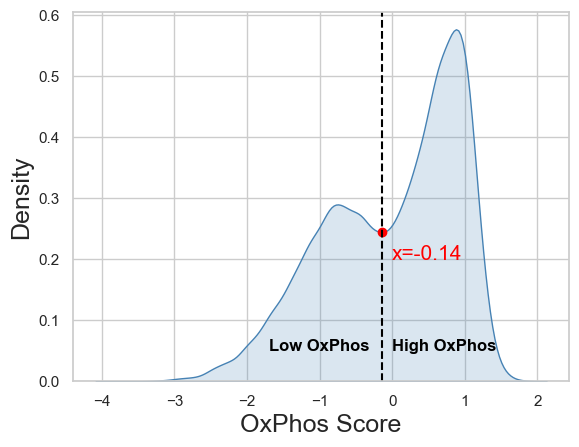

Local minima occur at: [-3.56278376 -0.14397881]


In [213]:
# KDE Plot
sns.kdeplot(exp_data['OxPhos_score'], fill=True, color="steelblue", alpha=0.2)
plt.xlabel('OxPhos_score')
plt.ylabel('Density')

# Compute KDE
kde = gaussian_kde(exp_data['OxPhos_score'])
x_vals = np.linspace(exp_data['OxPhos_score'].min(), exp_data['OxPhos_score'].max(), 1000)
density = kde(x_vals)

# Find local minima
minima_indices = argrelextrema(density, np.less)[0]
minima_values = x_vals[minima_indices]

# Plot minima points
plt.scatter(minima_values[1:], kde(minima_values[1:]), color='red', label='Local Minima')
plt.axvline(x = -0.14397881, linestyle = "--", color = "black")
plt.text(-1.7, 0.05, "Low OxPhos", fontsize = 12, color = "black", fontweight = "bold")
plt.text(0.0, 0.05, "High OxPhos", fontsize = 12, color = "black", fontweight = "bold")
plt.text(0.0, 0.2, "x=-0.14", fontsize = 15, color = "red")
plt.grid(True)
plt.xlabel('OxPhos Score', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.show()

# Print minima values
print("Local minima occur at:", minima_values)

In [214]:
exp_data["OxP_label"] = ["high_OxP" if x > -0.14397881 else "low_OxP" for x in exp_data["OxPhos_score"]]

In [215]:
scores_req

['EMT_score',
 'Glycolysis_score',
 'SN_score',
 'OxPhos_score',
 'Resistance score',
 'luminal score',
 'basal score',
 'Luminal-Basal Score',
 'RKIP',
 'BACH1',
 'PD_L1']

### Resistance Score

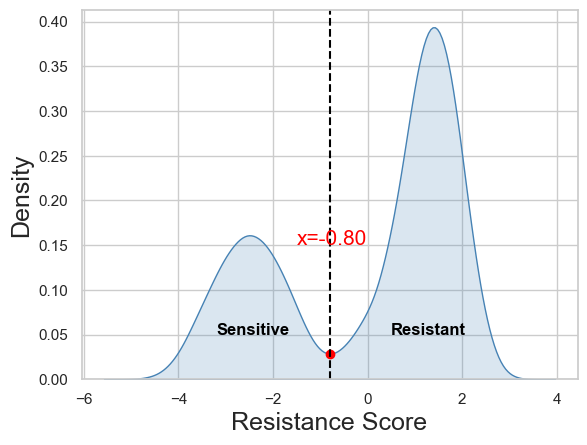

Local minima occur at: [-0.80023176]


In [216]:
# KDE Plot
sns.kdeplot(exp_data['Resistance score'], fill=True, color="steelblue", alpha=0.2)
plt.xlabel('Resistance score')
plt.ylabel('Density')

# Compute KDE
kde = gaussian_kde(exp_data['Resistance score'])
x_vals = np.linspace(exp_data['Resistance score'].min(), exp_data['Resistance score'].max(), 1000)
density = kde(x_vals)

# Find local minima
minima_indices = argrelextrema(density, np.less)[0]
minima_values = x_vals[minima_indices]

# Plot minima points
plt.scatter(minima_values, kde(minima_values), color='red', label='Local Minima')
plt.axvline(x = -0.80023176, linestyle = "--", color = "black")
plt.text(-3.2, 0.050, "Sensitive", fontsize = 12, color = "black", fontweight = "bold")
plt.text(0.50, 0.05, "Resistant", fontsize = 12, color = "black", fontweight = "bold")
plt.text(-1.5, 0.15, "x=-0.80", fontsize = 15, color = "red")
plt.grid(True)
plt.xlabel('Resistance Score', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.show()

# Print minima values
print("Local minima occur at:", minima_values)

In [217]:
exp_data["Resistance label"] = ["Resistant" if x > -0.80023176 else "Sensitive" for x in exp_data["Resistance score"]]

### Luminal Analysis

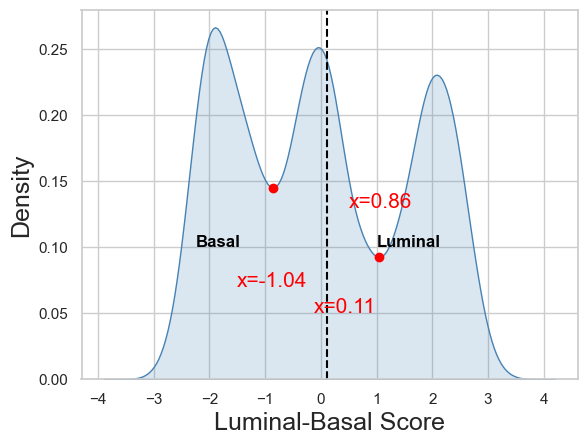

Local minima occur at: [-0.85764059  1.04176209]


In [218]:
# KDE Plot
sns.kdeplot(exp_data['Luminal-Basal Score'], fill=True, color="SteelBlue", alpha=0.2)
plt.xlabel('Luminal-Basal Score')
plt.ylabel('Density')

# Compute KDE
kde = gaussian_kde(exp_data['Luminal-Basal Score'])
x_vals = np.linspace(exp_data['Luminal-Basal Score'].min(), exp_data['Luminal-Basal Score'].max(), 1000)
density = kde(x_vals)

# Find local minima
minima_indices = argrelextrema(density, np.less)[0]
minima_values = x_vals[minima_indices]

plt.axvline(x = 0.10575283309962824, linestyle = "--", color = "black")
# plt.axvline(x = 0.85764059, linestyle = "--", color = "black")
plt.text(-2.25, 0.10, "Basal", fontsize = 12, color = "black", fontweight = "bold")
plt.text(1, 0.10, "Luminal", fontsize = 12, color = "black", fontweight = "bold")
plt.text(-0.13, 0.05, "x=0.11", fontsize = 15, color = "red")
plt.text(-1.5, 0.07, "x=-1.04", fontsize = 15, color = "red")
plt.text(0.5, 0.13, "x=0.86", fontsize = 15, color = "red")
# Plot minima points
plt.scatter(minima_values, kde(minima_values), color='red', label='Local Minima')
plt.grid(True)
plt.xlabel('Luminal-Basal Score', fontsize=18)
plt.ylabel('Density', fontsize=18)
plt.show()

# Print minima values
print("Local minima occur at:", minima_values)

In [219]:
import statistics

statistics.median(exp_data['Luminal-Basal Score'].values)

np.float64(-0.10575283309962824)

In [220]:
exp_data["lum_Basal_label"] = ["Basal" if x < -0.10575283309962824 else "Luminal" for x in exp_data['Luminal-Basal Score']]
exp_data["lum_Basal_label"].value_counts() 

lum_Basal_label
Luminal    35606
Basal      35605
Name: count, dtype: int64

In [221]:
list_EM = list(exp_data["EMT_label"].unique())
list_SN = list(exp_data["SN_label"].unique())
list_Gly = list(exp_data["Gly_label"].unique())
list_OxP = list(exp_data["OxP_label"].unique())
list_resistance = list(exp_data["Resistance label"].unique())
list_luminal_basal = list(exp_data["lum_Basal_label"].unique())

print(list_EM, list_SN, list_Gly, list_OxP, list_resistance, list_luminal_basal)

['Mesenchymal', 'Hybrid', 'Epithelial'] ['Non-stem-like', 'Stem-like'] ['low_glyc', 'high_glyc'] ['low_OxP', 'high_OxP'] ['Resistant', 'Sensitive'] ['Basal', 'Luminal']


In [222]:
list_phenotypes = list_EM + list_SN + list_Gly + list_OxP + list_resistance + list_luminal_basal
list_phenotypes

['Mesenchymal',
 'Hybrid',
 'Epithelial',
 'Non-stem-like',
 'Stem-like',
 'low_glyc',
 'high_glyc',
 'low_OxP',
 'high_OxP',
 'Resistant',
 'Sensitive',
 'Basal',
 'Luminal']

In [223]:
df_EMT_vs_other = pd.DataFrame(index = list_phenotypes, columns =['Mesenchymal', 'Hybrid', 'Epithelial'])
df_EMT_vs_other

,Mesenchymal,Hybrid,Epithelial
Mesenchymal,NaN,NaN,NaN
Hybrid,NaN,NaN,NaN
Epithelial,NaN,NaN,NaN
Non-stem-like,NaN,NaN,NaN
Stem-like,NaN,NaN,NaN
low_glyc,NaN,NaN,NaN
high_glyc,NaN,NaN,NaN
low_OxP,NaN,NaN,NaN
high_OxP,NaN,NaN,NaN
Resistant,NaN,NaN,NaN


In [224]:
for i in list_EM:
        df_EMT_vs_other.loc[i, "Mesenchymal"] = exp_data[(exp_data["EMT_label"] == "Mesenchymal") & (exp_data["EMT_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Mesenchymal")].shape[0]
        df_EMT_vs_other.loc[i, "Hybrid"] = exp_data[(exp_data["EMT_label"] == "Hybrid") & (exp_data["EMT_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Hybrid")].shape[0]
        df_EMT_vs_other.loc[i, "Epithelial"] = exp_data[(exp_data["EMT_label"] == "Epithelial") & (exp_data["EMT_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Epithelial")].shape[0]

for i in list_SN:
        df_EMT_vs_other.loc[i, "Mesenchymal"] = exp_data[(exp_data["EMT_label"] == "Mesenchymal") & (exp_data["SN_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Mesenchymal")].shape[0]
        df_EMT_vs_other.loc[i, "Hybrid"] = exp_data[(exp_data["EMT_label"] == "Hybrid") & (exp_data["SN_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Hybrid")].shape[0]
        df_EMT_vs_other.loc[i, "Epithelial"] = exp_data[(exp_data["EMT_label"] == "Epithelial") & (exp_data["SN_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Epithelial")].shape[0]

for i in list_Gly:
        df_EMT_vs_other.loc[i, "Mesenchymal"] = exp_data[(exp_data["EMT_label"] == "Mesenchymal") & (exp_data["Gly_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Mesenchymal")].shape[0]
        df_EMT_vs_other.loc[i, "Hybrid"] = exp_data[(exp_data["EMT_label"] == "Hybrid") & (exp_data["Gly_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Hybrid")].shape[0]
        df_EMT_vs_other.loc[i, "Epithelial"] = exp_data[(exp_data["EMT_label"] == "Epithelial") & (exp_data["Gly_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Epithelial")].shape[0]

for i in list_OxP:
        df_EMT_vs_other.loc[i, "Mesenchymal"] = exp_data[(exp_data["EMT_label"] == "Mesenchymal") & (exp_data["OxP_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Mesenchymal")].shape[0]
        df_EMT_vs_other.loc[i, "Hybrid"] = exp_data[(exp_data["EMT_label"] == "Hybrid") & (exp_data["OxP_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Hybrid")].shape[0]
        df_EMT_vs_other.loc[i, "Epithelial"] = exp_data[(exp_data["EMT_label"] == "Epithelial") & (exp_data["OxP_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Epithelial")].shape[0]

for i in list_resistance:
        df_EMT_vs_other.loc[i, "Mesenchymal"] = exp_data[(exp_data["EMT_label"] == "Mesenchymal") & (exp_data["Resistance label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Mesenchymal")].shape[0]
        df_EMT_vs_other.loc[i, "Hybrid"] = exp_data[(exp_data["EMT_label"] == "Hybrid") & (exp_data["Resistance label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Hybrid")].shape[0]
        df_EMT_vs_other.loc[i, "Epithelial"] = exp_data[(exp_data["EMT_label"] == "Epithelial") & (exp_data["Resistance label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Epithelial")].shape[0]

for i in list_luminal_basal:
        df_EMT_vs_other.loc[i, "Mesenchymal"] = exp_data[(exp_data["EMT_label"] == "Mesenchymal") & (exp_data["lum_Basal_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Mesenchymal")].shape[0]
        df_EMT_vs_other.loc[i, "Hybrid"] = exp_data[(exp_data["EMT_label"] == "Hybrid") & (exp_data["lum_Basal_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Hybrid")].shape[0]
        df_EMT_vs_other.loc[i, "Epithelial"] = exp_data[(exp_data["EMT_label"] == "Epithelial") & (exp_data["lum_Basal_label"] == i)].shape[0] / exp_data[(exp_data["EMT_label"] == "Epithelial")].shape[0]

<Axes: >

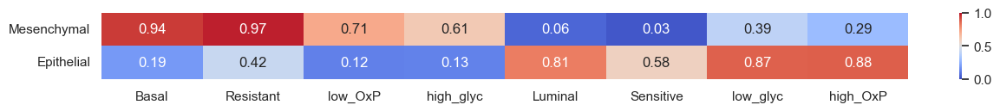

In [225]:
order = ["Mesenchymal", "Hybrid", "Epithelial", "Basal", "Resistant", "low_OxP", "high_glyc", "Luminal", "Sensitive", "low_glyc",  "high_OxP", "Non-stem-like", "Stem-like"]
plt.figure(figsize=(15, 1))
sns.heatmap(df_EMT_vs_other.T.loc[["Mesenchymal", "Epithelial"], order[3:-2]].astype(float), cmap="coolwarm", annot=True, fmt=".2f", vmax=1, vmin=0)
# plt.title("Conditional Probability of Mes/Epi given Other Phenotypes")

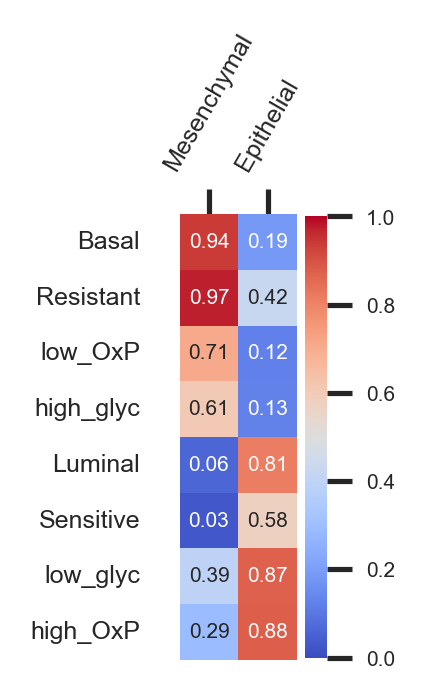

In [226]:
plt.figure(figsize=(1.5, 2.5), dpi=300)
ax = sns.heatmap(
    df_EMT_vs_other.loc[order[3:-2], ["Mesenchymal", "Epithelial"]].astype(float),
    cmap="coolwarm",
    annot=True,
    fmt=".2f",
    vmax=1,
    vmin=0, 
    annot_kws={"size": 5}
)

# Move x-axis labels to the top
ax.xaxis.set_ticks_position("top")
ax.xaxis.set_label_position("top")
ax.tick_params(axis="x", rotation=60, labelsize=6)
ax.tick_params(axis="y", labelsize=6)

# Change colorbar tick font size
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=5)   # 👈 set fontsize here

plt.tight_layout()
plt.show()
